In [3]:
import pandas as pd
import numpy as np
import Levenshtein
import re
from  translate import Translator
from sklearn.cluster import KMeans
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_score
from tensorflow.keras.layers import Input, Dense, Lambda, Layer
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.losses import mse
import tensorflow as tf
import matplotlib.pyplot as plt

translator = Translator(to_lang="en")


In [4]:
unique = pd.read_csv("../dataset/result_cleaning_data.csv")
data = pd.read_csv("../dataset/cleaned_data.csv")

print(unique.head())
print(data.head())

C:\Users\Rizal\AppData\Local\Temp\ipykernel_17400\1811373139.py:2: DtypeWarning: Columns (194,195,196,250,258,261,262,263,270,271,272,273,274,275,317,330,332,333,337,338,339,340,344,345,346,347,351,352,353,354,358,359,360,361,365,366,367,368,372,373,374,375,379,380,381,382,384,385,386,387,389,390,408,460,469,478,485,487,488,494,495,496,497,498,503,504,505,506,507,512,513,514,515,516,521,522,523,524,525,528,529,530,531,532,613,622,624,625,626,646,647,648,649,650,651,659,660,661,662,663,668,669,670,671,672,677,678,679,680,681,691,692,696,697,702,703,704,709,710,711,718,719,720,727,728,729,736,737,738,746,747,748,749,750,755,756,757,758,759,764,765,766,767,768,773,774,775,776,777,782,783,784,785,786,791,792,793,794,795,800,801,802,803,804,809,810,811,812,813,818,819,820,821,822,827,828,829,830,831,836,837,838,839,840,845,846,847,848,849,850,851,860,861,862,866,867,868,872,873,874,875,876,877,878,879,880,881,882,883,884,885,899,900,901,906,907,908,913,914,915,920,921,922,927,928,929,934,93

   Unnamed: 0                      0                  1           2  \
0           0      software engineer             intern     manager   
1           1       computer science            general  management   
2           2  boy scouts of america           sciences  technology   
3           3  boy scouts of america           sciences  technology   
4           4                   inc.  software engineer       owner   

                         3                        4                       5  \
0       research assistant                 director         project manager   
1  business administration                  finance  mechanical engineering   
2        purdue university  the university of texas           college board   
3        purdue university  the university of texas           college board   
4                      llc                  founder                director   

                        6                         7                         8  \
0                

**experiences/{j}/title**

In [5]:
data["accomplishment_projects/0/title"]

0                                                     NaN
1                                                     NaN
2                                               GavelRank
3                                                     NaN
4       Development of an Active Tremor Cancellation (...
                              ...                        
8934    Mixologi Releases Wickedest Dancehall Crossove...
8935                                                  NaN
8936                                                  NaN
8937                            Space Frontier Board Game
8938                                                  NaN
Name: accomplishment_projects/0/title, Length: 8939, dtype: object

In [6]:
max_num = 0
for i in range(83):
    try:
        print(data[f"accomplishment_projects/{i}/title"])
    except:
        break
    max_num = i

max_num

0                                                     NaN
1                                                     NaN
2                                               GavelRank
3                                                     NaN
4       Development of an Active Tremor Cancellation (...
                              ...                        
8934    Mixologi Releases Wickedest Dancehall Crossove...
8935                                                  NaN
8936                                                  NaN
8937                            Space Frontier Board Game
8938                                                  NaN
Name: accomplishment_projects/0/title, Length: 8939, dtype: object
0                                                     NaN
1                                                     NaN
2                                           CTF Resources
3                                                     NaN
4                                                     NaN
     

60

In [7]:
data = data[[f"accomplishment_projects/{i}/title"  if i > 0 else "full_name" for i in range(22)]]

data

,full_name,accomplishment_projects/1/title,accomplishment_projects/2/title,accomplishment_projects/3/title,accomplishment_projects/4/title,accomplishment_projects/5/title,accomplishment_projects/6/title,accomplishment_projects/7/title,accomplishment_projects/8/title,accomplishment_projects/9/title,...,accomplishment_projects/12/title,accomplishment_projects/13/title,accomplishment_projects/14/title,accomplishment_projects/15/title,accomplishment_projects/16/title,accomplishment_projects/17/title,accomplishment_projects/18/title,accomplishment_projects/19/title,accomplishment_projects/20/title,accomplishment_projects/21/title
0,Jeff B.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Andrew Bailey,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Alex Cabrera,CTF Resources,Hashicon,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Alcino de Oliveira Manuel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Ali Farhat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8934,Aaron Dolores,"Reggae Revival Panel at SXSW 2017 w/ Jah 9, Ka...","Reggae Revival, Dancehall Culture & Jamaican I...",Mixologi Presents: How to Make it in Hong Kong...,Mixologi Video-ZimDancehall: The Voice of Zimb...,Bay Area Legend E-A-SKI Reflects on N.W.A. + P...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8935,"Aaron Dominy, MBA",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8936,Aaron Williams,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8937,Aaron Dona,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
colomns = unique.iloc[3].dropna()
colomns

Unnamed: 0                                   3
0                        boy scouts of america
1                                     sciences
2                                   technology
3                            purdue university
                            ...               
855                             usl league one
856           the university of north carolina
857                 first robotics competition
858            digipen institute of technology
859                                        sap
Name: 3, Length: 861, dtype: object

In [9]:
colomns = [str(col) for col in colomns.to_list()]
colomns

['3',
 'boy scouts of america',
 'sciences',
 'technology',
 'purdue university',
 'the university of texas',
 'college board',
 'university of illinois',
 'university of california',
 'collabera inc',
 'us army',
 'comcast',
 'rutgers university',
 'deloitte',
 'inc.',
 'tata consultancy services',
 'university of michigan',
 'enterprise insurance replacement division',
 'american advertising federation',
 'ibm',
 'u.s. army',
 'college of engineering',
 'united states marine corps',
 'georgia institute of technology',
 'technology student association',
 'national merit scholarship corporation',
 'department of chemistry',
 'collegeboard',
 'national science foundation',
 'india',
 'drexel university',
 'new york university',
 'university of maryl',
 'north carolina press photographers assc.',
 'cisco systems',
 'john mackenzie high school',
 'las vegas',
 'university of texas',
 'university of florida',
 'mindtree ltd.',
 'intel corporation',
 'government of india',
 'future business

Pencarian kedekatan dengan menggunakan cosine similarity\
Cosine Similarity mengukur kesamaan antara dua vektor dengan mengukur sudut kosinus di antara keduanya. Dengan menggunakan TF-IDF (Term Frequency-Inverse Document Frequency), Anda bisa mengonversi kalimat menjadi vektor yang merepresentasikan pentingnya kata-kata dalam kalimat tersebut.

In [10]:

def most_similarity(input_word, data):
    most_similar_word = None
    highest_similarity = -1

    for word in data:
        distance = Levenshtein.distance(input_word, word)
        similarity = 1 - (distance / max(len(input_word), len(word)))

        if similarity > highest_similarity:
            highest_similarity = similarity
            most_similar_word = word

    return most_similar_word

input_word = "kardi"

sample = ["Kardus", "Karpet", "Karikatur"]

output = most_similarity(input_word, sample)

print(output)  


Kardus


In [11]:
def extract_each_title(title_list):
    exp_titles = []
    for exp_title in title_list:
        parts = str(exp_title).lower().replace("and", ",").replace("|", ",").replace("/", ",").replace("&", ",")\
            .replace(" – ", ",").replace(" - ", ",").split(",")
        
        parts = [part.strip() for part in parts]
        
        parts = [part.split(" at ")[0].strip() for part in parts]
        parts = [part.split(" on ")[0].strip() for part in parts]
        parts = [part for part in parts if len(part) > 1]
        parts = [re.sub(r"[()]", "", part) for part in parts]
        parts = [translator.translate(part) for part in parts]
        
        exp_titles.extend(parts)
    # print(exp_titles)
    return exp_titles

title_each_people = [extract_each_title(data.drop(columns="full_name").iloc[i].dropna()) for i in range(len(data))]
title_each_people


[[],
 [],
 ['ctf resources', 'hashicon'],
 [],
 [],
 ['market reactions to the 2014 wide stress test of european banks.'],
 [],
 [],
 ['ms thesis', 'bs project'],
 [],
 ['aggregion'],
 [],
 [],
 [],
 [],
 ['shaft design', 'analysis'],
 [],
 [],
 [],
 [],
 [],
 ['live surgery',
  'up to date',
  'acriva reviol tri-ed',
  'vsy biotechnology iol acriva',
  'fidial e fidial plus',
  'intracinol',
  'proxelan',
  'rinocapsina',
  'linfovir'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['trimming git object history for critical repositories',
  'convert compose v2 to v3',
  'parallel docker logs for multiple containers',
  'influxdb sample data generator',
  'elasticsearch http log query string indexing',
  'zabbix problem auto-resolution',
  'ansible dynamic inventory',
  'ransomware detection with inotify',
  'samba-based dfs namespace network share redesign',
  'intrusion detection',
  'configuration automation',
  'inktel.wiki',
  'it_docs',
  'centralized',
  'domain-integrated documentation',

In [12]:
title_each_people = [title for title in title_each_people if len(title) != 0]
title_each_people

[['ctf resources', 'hashicon'],
 ['market reactions to the 2014 wide stress test of european banks.'],
 ['ms thesis', 'bs project'],
 ['aggregion'],
 ['shaft design', 'analysis'],
 ['live surgery',
  'up to date',
  'acriva reviol tri-ed',
  'vsy biotechnology iol acriva',
  'fidial e fidial plus',
  'intracinol',
  'proxelan',
  'rinocapsina',
  'linfovir'],
 ['trimming git object history for critical repositories',
  'convert compose v2 to v3',
  'parallel docker logs for multiple containers',
  'influxdb sample data generator',
  'elasticsearch http log query string indexing',
  'zabbix problem auto-resolution',
  'ansible dynamic inventory',
  'ransomware detection with inotify',
  'samba-based dfs namespace network share redesign',
  'intrusion detection',
  'configuration automation',
  'inktel.wiki',
  'it_docs',
  'centralized',
  'domain-integrated documentation',
  'inktel.chat',
  'self-hosted chat',
  'messaging platform',
  'remote windows software deployment repository wi

In [13]:
np.zeros(len(colomns))

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [14]:
index_col = {}

for i in range(len(colomns)):
    index_col[colomns[i]] = i

index_col

{'3': 0,
 'boy scouts of america': 1,
 'sciences': 2,
 'technology': 3,
 'purdue university': 4,
 'the university of texas': 5,
 'college board': 6,
 'university of illinois': 7,
 'university of california': 8,
 'collabera inc': 9,
 'us army': 10,
 'comcast': 11,
 'rutgers university': 12,
 'deloitte': 13,
 'inc.': 14,
 'tata consultancy services': 15,
 'university of michigan': 16,
 'enterprise insurance replacement division': 17,
 'american advertising federation': 18,
 'ibm': 19,
 'u.s. army': 20,
 'college of engineering': 21,
 'united states marine corps': 22,
 'georgia institute of technology': 23,
 'technology student association': 24,
 'national merit scholarship corporation': 25,
 'department of chemistry': 26,
 'collegeboard': 27,
 'national science foundation': 28,
 'india': 29,
 'drexel university': 30,
 'new york university': 31,
 'university of maryl': 32,
 'north carolina press photographers assc.': 33,
 'cisco systems': 34,
 'john mackenzie high school': 35,
 'las vegas

In [15]:
def sentences_count(titles):
    frequency = [0 for i in range(len(colomns))]

    normalize_data = [most_similarity(title, colomns) for title in titles]

    for title in normalize_data:
        frequency[index_col[title]] += 1
    return frequency

title_frequencies = [sentences_count(title) for title in title_each_people ]
title_frequencies
    

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


In [16]:
title_each_people[0]

['ctf resources', 'hashicon']

In [17]:
new_data = pd.DataFrame(title_frequencies, columns=colomns).drop(columns="3")
new_data

,boy scouts of america,sciences,technology,purdue university,the university of texas,college board,university of illinois,university of california,collabera inc,us army,...,ecoast marketing,tierney,tierney brothers,clemson university school of architecture,crn,usl league one,the university of north carolina,first robotics competition,digipen institute of technology,sap
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
993,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
994,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [18]:
# Parameter VAE
input_dim = new_data.shape[1]
intermediate_dim = 64
latent_dim = 2

# Encoder
inputs = Input(shape=(input_dim,))
h = Dense(intermediate_dim, activation='relu')(inputs)

z_mean = Dense(latent_dim)(h)
z_log_var = Dense(latent_dim)(h)

def sampling(args):
    z_mean, z_log_var = args
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

# Decoder
decoder_h = Dense(intermediate_dim, activation='relu')
decoder_mean = Dense(input_dim, activation='sigmoid')

h_decoded = decoder_h(z)
x_decoded_mean = decoder_mean(h_decoded)

# VAE model
vae = Model(inputs, x_decoded_mean)

# Compute VAE loss
reconstruction_loss = mse(inputs, x_decoded_mean)
reconstruction_loss *= input_dim
kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)

vae.add_loss(vae_loss)
vae.compile(optimizer='adam')

# Train the VAE
vae.fit(new_data, epochs=100, batch_size=2, shuffle=True)





Epoch 1/100
498/498 [==============================] - 11s 7ms/step - loss: 42.1007
Epoch 2/100
498/498 [==============================] - 3s 6ms/step - loss: 7.8010
Epoch 3/100
498/498 [==============================] - 3s 6ms/step - loss: 6.9688
Epoch 4/100
498/498 [==============================] - 3s 5ms/step - loss: 6.7888
Epoch 5/100
498/498 [==============================] - 3s 6ms/step - loss: 6.7306
Epoch 6/100
498/498 [==============================] - 3s 6ms/step - loss: 6.7073
Epoch 7/100
498/498 [==============================] - 3s 6ms/step - loss: 6.6979
Epoch 8/100
498/498 [==============================] - 3s 6ms/step - loss: 6.6921
Epoch 9/100
498/498 [==============================] - 2s 5ms/step - loss: 6.6880
Epoch 10/100
498/498 [==============================] - 2s 5ms/step - loss: 6.6852
Epoch 11/100
498/498 [==============================] - 3s 5ms/step - loss: 6.6865
Epoch 12/100
498/498 [==============================] - 3s 5ms/step - loss: 6.6860
Epoch 13

In [19]:
new_data.shape

(996, 860)

In [20]:
# Define encoder model to extract latent space
encoder = Model(inputs, z_mean)

# Ekstraksi fitur kompresi dari latent space
compressed_features = encoder.predict(new_data.to_numpy())
print(compressed_features)


32/32 [==============================] - 1s 4ms/step
[[ 0.00132636 -0.00142663]
 [ 0.00119606 -0.0018562 ]
 [ 0.00134146 -0.00203998]
 ...
 [ 0.00121782 -0.00178447]
 [ 0.00114632 -0.00202017]
 [ 0.0016853  -0.00024334]]


In [21]:
input_dim = new_data.shape[1]  # Sesuaikan dengan data Anda
intermediate_dim = 500  # Ukuran layer intermediate, dapat disesuaikan
latent_dim = compressed_features.shape[1]  # Dimensi latent space
n_clusters = 3  # Jumlah cluster

# Clustering layer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters

    def build(self, input_shape):
        self.input_dim = input_shape[1]
        self.clusters = self.add_weight(shape=(self.n_clusters, self.input_dim), initializer='glorot_uniform', name='clusters')

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2))
        q **= (self.input_dim + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

# Define DEC model
inputs = Input(shape=(input_dim,))
h = Dense(intermediate_dim, activation='relu')(inputs)

z_mean = Dense(latent_dim)(h)
z_log_var = Dense(latent_dim)(h)

# Sampling function
def sampling(args):
    z_mean, z_log_var = args
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

# DEC specific layers
clustering_layer = ClusteringLayer(n_clusters, name='clustering')(z)
dec = Model(inputs, clustering_layer)

kmeans = KMeans(n_clusters=n_clusters, n_init=20)
y_pred = kmeans.fit_predict(compressed_features)
dec.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

# Custom training loop
optimizer = SGD(0.01, 0.9)

# Convert inputs to TensorFlow variable
X_tf = tf.convert_to_tensor(new_data.to_numpy(), dtype=tf.float32)

epochs = 100
batch_size = 2

for epoch in range(epochs):
    with tf.GradientTape() as tape:
        q = dec(X_tf)
        p = tf.pow(q, 2) / tf.reduce_sum(q, axis=0)
        p /= tf.reduce_sum(p, axis=1, keepdims=True)
        loss = tf.reduce_mean(tf.keras.losses.KLD(p, q))
    grads = tape.gradient(loss, dec.trainable_weights)
    optimizer.apply_gradients(zip(grads, dec.trainable_weights))
    if epoch % 10 == 0:
        print(f'Epoch {epoch}, Loss: {loss.numpy()}')

# Assign clusters to data points
q = dec.predict(new_data.to_numpy())
y_pred_final = q.argmax(1)

# Menampilkan hasil clustering
new_data['Cluster'] = y_pred_final
print(new_data)

Epoch 0, Loss: 1.2644919706872315e-06
Epoch 10, Loss: 9.653297183831455e-07
Epoch 20, Loss: 5.735872719014878e-07
Epoch 30, Loss: 3.115863194125268e-07
Epoch 40, Loss: 1.3328951808944112e-07
Epoch 50, Loss: 5.056269003489433e-08
Epoch 60, Loss: 2.0661486743733803e-08
Epoch 70, Loss: 1.951248274068007e-09
Epoch 80, Loss: -3.568989326296901e-09
Epoch 90, Loss: -1.000704852316403e-08
32/32 [==============================] - 0s 5ms/step
     boy scouts of america  sciences  technology  purdue university  \
0                        0         0           0                  0   
1                        0         0           0                  0   
2                        0         0           0                  0   
3                        0         0           0                  0   
4                        0         0           0                  0   
..                     ...       ...         ...                ...   
991                      0         0           0                  

In [22]:
print(compressed_features.shape)  # Pastikan ini sesuai dengan latent_dim yang diharapkan


(996, 2)


In [23]:
new_data["Cluster"].value_counts()

Cluster
2    499
1    491
0      6
Name: count, dtype: int64

In [24]:
# Menghitung Silhouette Score
score = silhouette_score(compressed_features, y_pred_final)
print(f'Silhouette Score: {score}')


Silhouette Score: -0.30255478620529175


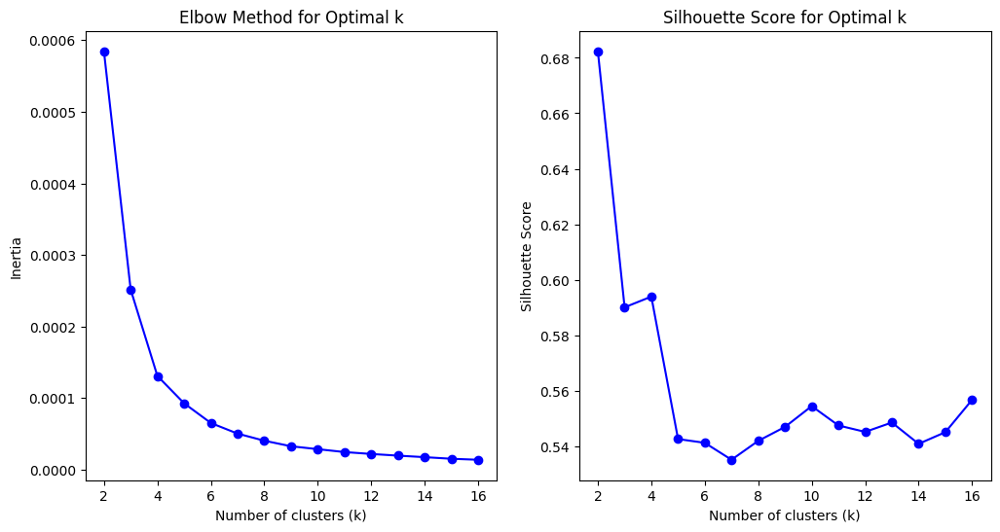

Best k based on Silhouette Score: 2


In [26]:
def find_best_k(data, max_k=16):
    inertia = []
    silhouette_scores = []

    for k in range(2, max_k + 1):
        kmeans = KMeans(n_clusters=k, n_init=20)
        kmeans.fit(data)
        
        # Append inertia (within-cluster sum of squares)
        inertia.append(kmeans.inertia_)
        
        # Compute silhouette score
        score = silhouette_score(data, kmeans.labels_)
        silhouette_scores.append(score)

    # Plotting the Elbow Method
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(range(2, max_k + 1), inertia, 'bo-')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal k')
    

    # Plotting the Silhouette Score
    plt.subplot(1, 2, 2)
    plt.plot(range(2, max_k + 1), silhouette_scores, 'bo-')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score for Optimal k')

    plt.show()

    # Best k based on silhouette score
    best_k = silhouette_scores.index(max(silhouette_scores)) + 2
    print(f'Best k based on Silhouette Score: {best_k}')

    return best_k

# Assuming compressed_features is your data after feature extraction
best_k = find_best_k(compressed_features, max_k=16)

In [29]:
input_dim = new_data.shape[1]  # Sesuaikan dengan data Anda
intermediate_dim = 500  # Ukuran layer intermediate, dapat disesuaikan
latent_dim = compressed_features.shape[1]  # Dimensi latent space
n_clusters = 4  # Jumlah cluster


# Define DEC model
inputs = Input(shape=(input_dim,))
h = Dense(intermediate_dim, activation='relu')(inputs)

z_mean = Dense(latent_dim)(h)
z_log_var = Dense(latent_dim)(h)

# Sampling function
def sampling(args):
    z_mean, z_log_var = args
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

# DEC specific layers
clustering_layer = ClusteringLayer(n_clusters, name='clustering')(z)
dec = Model(inputs, clustering_layer)

kmeans = KMeans(n_clusters=n_clusters, n_init=20)
y_pred = kmeans.fit_predict(compressed_features)
dec.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

# Custom training loop
optimizer = SGD(0.01, 0.9)

# Convert inputs to TensorFlow variable
X_tf = tf.convert_to_tensor(new_data.to_numpy(), dtype=tf.float32)

epochs = 100
batch_size = 2

for epoch in range(epochs):
    with tf.GradientTape() as tape:
        q = dec(X_tf)
        p = tf.pow(q, 2) / tf.reduce_sum(q, axis=0)
        p /= tf.reduce_sum(p, axis=1, keepdims=True)
        loss = tf.reduce_mean(tf.keras.losses.KLD(p, q))
    grads = tape.gradient(loss, dec.trainable_weights)
    optimizer.apply_gradients(zip(grads, dec.trainable_weights))
    if epoch % 10 == 0:
        print(f'Epoch {epoch}, Loss: {loss.numpy()}')

# Assign clusters to data points
q = dec.predict(new_data.to_numpy())
y_pred_final = q.argmax(1)

# Menampilkan hasil clustering
new_data['Cluster'] = y_pred_final
print(new_data)

Epoch 0, Loss: 1.3162383538656286e-06
Epoch 10, Loss: 1.1272303481746349e-06
Epoch 20, Loss: 6.966286605347705e-07
Epoch 30, Loss: 4.462404490368499e-07
Epoch 40, Loss: 2.757622326043929e-07
Epoch 50, Loss: 1.4945729276405473e-07
Epoch 60, Loss: 8.002753304481303e-08
Epoch 70, Loss: 4.609021431178917e-08
Epoch 80, Loss: 2.7314282391444067e-08
Epoch 90, Loss: 1.6808883174235234e-08
32/32 [==============================] - 1s 7ms/step
     boy scouts of america  sciences  technology  purdue university  \
0                        0         0           0                  0   
1                        0         0           0                  0   
2                        0         0           0                  0   
3                        0         0           0                  0   
4                        0         0           0                  0   
..                     ...       ...         ...                ...   
991                      0         0           0                  

In [30]:
vae.save('../model/acc_project/vae_model.h5')
dec.save('../model/acc_project/dec_model.h5')

c:\Users\Rizal\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
